# Transforming workflow for coeanography study using S2 data, from SAFE to ZARR

This is a part of  notebook which we will show the example of transformation of research workflow using SAFE file format to new EOPF ZARR format. 


We use example from a repository https://github.com/cuevas-a97/S2_Codes , which shows the computation of oceanic current using S2L1C images. 

To understand the scientific background of this notebook, please reffer to https://agupubs.onlinelibrary.wiley.com/doi/full/10.1002/2016JC012425

This notebook  show the workflow using zarr format.  

All the research sofware that was used in https://github.com/cuevas-a97/S2_Codes, can also be omitted since the new zarr product already can load necessary data with the functionality available from EOPF zarr format.  

You can test this notebook using following docker image

``` 
docker.io/tinaok/eopf-webiner6-docker:latest
```



## Access the Analysisi Ready Clowed Optimised EOPF ZARR  file
### Import dependencies accessing the  EOPF ZARR format. 

It is very easy. I used EOPF Sample service example notebook and just copied pasted some cells. 
https://eopf-sample-service.github.io/eopf-sample-notebooks/stac-eopf-zarr-sentinel



In [1]:
#import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import numpy as np
import pystac_client
import xarray as xr
from pystac_client import CollectionSearch
#from matplotlib.gridspec import GridSpec
import hvplot.xarray
import pandas as pd
import matplotlib.patches as patches
import holoviews as hv


### Use pystac client and connect to the eopf zarr data

In [2]:
#lets try to specify 'ocean' point and see if we have any specific metadta to collect 'ocean' parts from stac catalog,

catalog = pystac_client.Client.open("https://stac.core.eopf.eodc.eu")
LON, LAT = -4.5, 48

date = "2025-07-07/2025-07-11"
date = "2025-06-17/2025-06-17"

collections=['sentinel-2-l1c']
collections=['sentinel-2-l1c','sentinel-2-l2a']
# Search with cloud cover filter
items = list(
    catalog.search(
        datetime=date,
        collections=collections,
    intersects=dict(type="Point", coordinates=[LON, LAT]),
        query={
            "eo:cloud_cover": {"lt": 20},
            "view:sun_elevation": {"lt": 27},
        },
    ).items()
)

for item in items:
        print(f"✅ {item.id}")


✅ S2B_MSIL2A_20250617T112109_N0511_R037_T30UUU_20250617T133829
✅ S2B_MSIL1C_20250617T112109_N0511_R037_T30UUU_20250617T131418


### Opening the L2A data in lazy xarray format using eopf xarray backend.  

In [3]:
item = items[0]  # extracting the first item

l2a = xr.open_dataset(
    item.assets["product"].href,
    **item.assets["product"].extra_fields["xarray:open_datatree_kwargs"],
)#.persist()    
l2a

/srv/conda/envs/notebook/lib/python3.12/site-packages/xarray/backends/plugins.py:110: RuntimeWarning: Engine 'kerchunk' loading failed:
No module named 'zarr.core.array_spec'; 'zarr.core' is not a package
  external_backend_entrypoints = backends_dict_from_pkg(entrypoints_unique)


<xarray.Dataset> Size: 9GB
Dimensions:                                            (
                                                        conditions_geometry_angle: 2,
                                                        conditions_geometry_band: 13,
                                                        conditions_geometry_y: 23,
                                                        conditions_geometry_x: 23,
                                                        conditions_geometry_detector: 7,
                                                        ...
                                                        quality_mask_r20m_y: 5490,
                                                        quality_mask_r20m_x: 5490,
                                                        quality_mask_r60m_y: 1830,
                                                        quality_mask_r60m_x: 1830,
                                                        quality_probability_y: 5490,
                                                        quality_probability_x: 5490)
Coordinates: (12/63)
  * conditions_geometry_angle                          (conditions_geometry_angle) <U7 56B ...
  * conditions_geometry_band                           (conditions_geometry_band) <U3 156B ...
  * conditions_geometry_detector                       (conditions_geometry_detector) int64 56B ...
  * conditions_geometry_x                              (conditions_geometry_x) int64 184B ...
  * conditions_geometry_y                              (conditions_geometry_y) int64 184B ...
  * conditions_mask_detector_footprint_r10m_x          (conditions_mask_detector_footprint_r10m_x) int64 88kB ...
    ...                                                 ...
  * quality_mask_r20m_y                                (quality_mask_r20m_y) int64 44kB ...
  * quality_mask_r60m_x                                (quality_mask_r60m_x) int64 15kB ...
  * quality_mask_r60m_y                                (quality_mask_r60m_y) int64 15kB ...
    quality_probability_band                           int64 8B ...
  * quality_probability_x                              (quality_probability_x) int64 44kB ...
  * quality_probability_y                              (quality_probability_y) int64 44kB ...
Data variables: (12/86)
    conditions_geometry_mean_sun_angles                (conditions_geometry_angle) float64 16B dask.array<chunksize=(2,), meta=np.ndarray>
    conditions_geometry_mean_viewing_incidence_angles  (conditions_geometry_band, conditions_geometry_angle) float64 208B dask.array<chunksize=(13, 2), meta=np.ndarray>
    conditions_geometry_sun_angles                     (conditions_geometry_angle, conditions_geometry_y, conditions_geometry_x) float64 8kB dask.array<chunksize=(2, 23, 23), meta=np.ndarray>
    conditions_geometry_viewing_incidence_angles       (conditions_geometry_band, conditions_geometry_detector, conditions_geometry_angle, conditions_geometry_y, conditions_geometry_x) float64 770kB dask.array<chunksize=(7, 4, 2, 23, 23), meta=np.ndarray>
    conditions_mask_detector_footprint_r10m_b02        (conditions_mask_detector_footprint_r10m_y, conditions_mask_detector_footprint_r10m_x) uint8 121MB dask.array<chunksize=(10980, 10980), meta=np.ndarray>
    conditions_mask_detector_footprint_r10m_b03        (conditions_mask_detector_footprint_r10m_y, conditions_mask_detector_footprint_r10m_x) uint8 121MB dask.array<chunksize=(10980, 10980), meta=np.ndarray>
    ...                                                 ...
    quality_mask_r20m_b8a                              (quality_mask_r20m_y, quality_mask_r20m_x) uint8 30MB dask.array<chunksize=(5490, 5490), meta=np.ndarray>
    quality_mask_r60m_b01                              (quality_mask_r60m_y, quality_mask_r60m_x) uint8 3MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
    quality_mask_r60m_b09                              (quality_mask_r60m_y, quality_mask_r60m_x) uint8 3MB dask.array<chunksize=(1830, 1830), me

### Opening the L1C data in  xarray format using eopf xarray backend

In [4]:
item = items[1]  # extracting the first item

l1c = xr.open_datatree(
    item.assets["product"].href,
    **item.assets["product"].extra_fields["xarray:open_datatree_kwargs"],
)#.compute()  
l1c

<xarray.DataTree>
Group: /
│   Attributes: (3)
├── Group: /conditions
│   ├── Group: /conditions/geometry
│   │       Dimensions:                        (angle: 2, band: 13, y: 23, x: 23,
│   │                                           detector: 7)
│   │       Coordinates:
│   │         * angle                          (angle) <U7 56B 'zenith' 'azimuth'
│   │         * band                           (band) <U3 156B 'b01' 'b02' ... 'b11' 'b12'
│   │         * detector                       (detector) int64 56B 3 4 5 6 7 8 9
│   │         * x                              (x) int64 184B 300000 305000 ... 410000
│   │         * y                              (y) int64 184B 5400000 5395000 ... 5290000
│   │       Data variables:
│   │           mean_sun_angles                (angle) float64 16B dask.array<chunksize=(2,), meta=np.ndarray>
│   │           mean_viewing_incidence_angles  (band, angle) float64 208B dask.array<chunksize=(13, 2), meta=np.ndarray>
│   │           sun_angles                     (angle, y, x) float64 8kB dask.array<chunksize=(2, 23, 23), meta=np.ndarray>
│   │           viewing_incidence_angles       (band, detector, angle, y, x) float64 770kB dask.array<chunksize=(7, 4, 2, 23, 23), meta=np.ndarray>
│   ├── Group: /conditions/mask
│   │   ├── Group: /conditions/mask/detector_footprint
│   │   │   ├── Group: /conditions/mask/detector_footprint/r10m
│   │   │   │       Dimensions:  (y: 10980, x: 10980)
│   │   │   │       Coordinates:
│   │   │   │         * x        (x) int64 88kB 300005 300015 300025 300035 ... 409775 409785 409795
│   │   │   │         * y        (y) int64 88kB 5399995 5399985 5399975 ... 5290225 5290215 5290205
│   │   │   │       Data variables:
│   │   │   │           b02      (y, x) uint8 121MB dask.array<chunksize=(10980, 10980), meta=np.ndarray>
│   │   │   │           b03      (y, x) uint8 121MB dask.array<chunksize=(10980, 10980), meta=np.ndarray>
│   │   │   │           b04      (y, x) uint8 121MB dask.array<chunksize=(10980, 10980), meta=np.ndarray>
│   │   │   │           b08      (y, x) uint8 121MB dask.array<chunksize=(10980, 10980), meta=np.ndarray>
│   │   │   ├── Group: /conditions/mask/detector_footprint/r20m
│   │   │   │       Dimensions:  (y: 5490, x: 5490)
│   │   │   │       Coordinates:
│   │   │   │         * x        (x) int64 44kB 300010 300030 300050 300070 ... 409750 409770 409790
│   │   │   │         * y        (y) int64 44kB 5399990 5399970 5399950 ... 5290250 5290230 5290210
│   │   │   │       Data variables:
│   │   │   │           b05      (y, x) uint8 30MB dask.array<chunksize=(5490, 5490), meta=np.ndarray>
│   │   │   │           b06      (y, x) uint8 30MB dask.array<chunksize=(5490, 5490), meta=np.ndarray>
│   │   │   │           b07      (y, x) uint8 30MB dask.array<chunksize=(5490, 5490), meta=np.ndarray>
│   │   │   │           b11      (y, x) uint8 30MB dask.array<chunksize=(5490, 5490), meta=np.ndarray>
│   │   │   │           b12      (y, x) uint8 30MB dask.array<chunksize=(5490, 5490), meta=np.ndarray>
│   │   │   │           b8a      (y, x) uint8 30MB dask.array<chunksize=(5490, 5490), meta=np.ndarray>
│   │   │   └── Group: /conditions/mask/detector_footprint/r60m
│   │   │           Dimensions:  (y: 1830, x: 1830)
│   │   │           Coordinates:
│   │   │             * x        (x) int64 15kB 300030 300090 300150 300210 ... 409650 409710 409770
│   │   │             * y        (y) int64 15kB 5399970 5399910 5399850 ... 5290350 5290290 5290230
│   │   │           Data variables:
│   │   │               b01      (y, x) uint8 3MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
│   │   │               b09      (y, x) uint8 3MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
│   │   │               b10      (y, x) uint8 3MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
│   │   └── Group: /conditions/mask/l1c_classification
│   │       └── Group: /conditions/mask/l1c_classification/r60m
│   │               Dimensions:  (y: 1830, x: 18

In [5]:
l1c.attrs['other_metadata']['mean_sun_azimuth_angle_in_deg_for_all_bands_all_detectors']
(list(l1c.attrs['other_metadata'].keys()))


['L0_ancillary_data_quality',
 'L0_ephemeris_data_quality',
 'NUC_table_ID',
 'SWIR_rearrangement_flag',
 'UTM_zone_identification',
 'absolute_location_assessment_from_AOCS',
 'band_description',
 'electronic_crosstalk_correction_flag',
 'eopf_category',
 'geometric_refinement',
 'history',
 'horizontal_CRS_code',
 'horizontal_CRS_name',
 'mean_sensing_time',
 'mean_sun_azimuth_angle_in_deg_for_all_bands_all_detectors',
 'mean_sun_zenith_angle_in_deg_for_all_bands_all_detectors',
 'meteo',
 'multispectral_registration_assessment',
 'onboard_compression_flag',
 'onboard_equalization_flag',
 'optical_crosstalk_correction_flag',
 'percentage_of_degraded_MSI_data',
 'planimetric_stability_assessment_from_AOCS',
 'product_quality_status',
 'reflectance_correction_factor_from_the_Sun-Earth_distance_variation_computed_using_the_acquisition_date',
 'spectral_band_of_reference']

In [6]:
bands=l1c['conditions/geometry'].band.values
bands

# 全バンドのデータをまとめるリスト
band_data = []

# 各バンドを順次処理
for band in bands:
#for band, desc in band_description.items():
    desc=band_description = l1c.attrs['other_metadata']['band_description'][band]
    srf_str = l1c.attrs['other_metadata']['band_description'][band]['spectral_response_values']

    # 各バンドの辞書を作成
    band_info = {
        'band': band,
        'bandwidth': float(desc.get('bandwidth', np.nan)),
        'central_wavelength': float(desc.get('central_wavelength', np.nan)),
        'onboard_compression_rate': float(desc.get('onboard_compression_rate', np.nan)),
        'onboard_integration_time': float(desc.get('onboard_integration_time', np.nan)),
        'physical_gain': float(desc.get('physical_gain', np.nan)),
        'spectral_response_step': int(desc.get('spectral_response_step')),
        'units': desc.get('units', ''),
        'wavelength_max': float(desc.get('wavelength_max', np.nan)),
        'wavelength_min': float(desc.get('wavelength_min', np.nan)),
        'spectral_response_values': srf_str##np.fromstring(srf_str, sep=' '),
    }

    band_data.append(band_info)
band_df = pd.DataFrame(band_data).set_index('band')

l1c_band_info = xr.Dataset.from_dataframe(
    band_df
)
r10_bands=list(l1c['measurements/reflectance/r10m/'].data_vars)
l1c_band_info.sel(band=r10_bands).onboard_integration_time


<xarray.DataArray 'onboard_integration_time' (band: 4)> Size: 32B
array([1.2646269, 1.2996743, 1.3405629, 1.3872929])
Coordinates:
  * band     (band) object 32B 'b02' 'b03' 'b04' 'b08'

In [7]:
# データ整理
srf_data = {}
max_len = 0
for band in bands:
    meta=l1c.attrs["other_metadata"]["band_description"][band]
    
    if "spectral_response_values" in meta:
        srf = np.fromstring(meta["spectral_response_values"], sep=" ")
        srf_data[band] = srf

# まず整数の最小・最大波長を求める
min_wave = int(l1c_band_info.wavelength_min.min())
max_wave = int(l1c_band_info.wavelength_max.max())

# 実波長ベースのインデックスを作る（1 nm 刻み）
wavelengths = np.arange(min_wave, max_wave + 1)



srf_array = xr.DataArray(
    data=np.array([
        np.pad(srf_data[band], 
               (int(l1c_band_info.wavelength_min.sel(band=band)) - min_wave, 
                len(wavelengths) - len(srf_data[band]) - (int(l1c_band_info.wavelength_min.sel(band=band)) - min_wave)), 
               constant_values=0)
        for band in srf_data
    ]),
    coords={"band": list(srf_data.keys()), "wavelength": wavelengths},
    dims=["band", "wavelength"],
    name="spectral_response"
)
srf_array.sel(band=list(l1c['measurements/reflectance/r10m/'].data_vars)).hvplot.line(
    x='wavelength',by='band')


:NdOverlay   [band]
   :Curve   [wavelength]   (spectral_response)

### Plot required values for the scientific workflow
It is required to have B02, B04, detector information, sun_angles, viewing_incidentce_angles, coordinate (longitude and latitude) are required for this scientific workflow.

As showin in the above l1c datset, this corresponds to following dataarray in L1c
- measurements_r10m_b02 (measurements_r10m_y: 10980, measurements_r10m_x: 10980)
l1c['measurements']['reflectance']['r10m'] 'b02'y: 10980x: 10980
- measurements_r10m_b04 (measurements_r10m_y: 10980, measurements_r10m_x: 10980)
l1c['measurements']['reflectance']['r10m'] 'b04'y: 10980x: 10980

- conditions_geometry_sun_angles (conditions_geometry_angle: 2, conditions_geometry_y: 23conditions_geometry_x: 23)
l1c['conditions']['geometry']['sun_angles']  angle: 2y: 23x: 23

- conditions_geometry_viewing_incidence_angles (conditions_geometry_band: 13, conditions_geometry_detector: 7, conditions_geometry_angle: 2, conditions_geometry_y: 23, conditions_geometry_x: 23)
l1c['conditions']['geometry']['viewing_incidence_angles']  'viewing_incidence_angles'band: 13detector: 7angle: 2y: 23x: 23

- conditions_mask_detector_footprint_r10m_b02 (conditions_mask_detector_footprint_r10m_y: 10980, conditions_mask_detector_footprint_r10m_x: 10980)
- conditions_mask_detector_footprint_r10m_b04 (conditions_mask_detector_footprint_r10m_y: 10980, conditions_mask_detector_footprint_r10m_x: 10980)
l1c['conditions']['mask']['detector_footprint']['r10m']  
y: 10980x: 10980



In [8]:
(
    l1c['conditions']['geometry']['sun_angles'].hvplot(
    x='x',y='y' )
+l1c['conditions']['geometry']['viewing_incidence_angles'].hvplot(
    x='x',y='y' 
)
)

:Layout
   .DynamicMap.I  :DynamicMap   [angle]
      :Image   [x,y]   (sun_angles)
   .DynamicMap.II :DynamicMap   [detector,band,angle]
      :Image   [x,y]   (viewing_incidence_angles)

In [9]:
l1c['conditions']['geometry']['sun_angles']

<xarray.DataArray 'sun_angles' (angle: 2, y: 23, x: 23)> Size: 8kB
dask.array<open_dataset-sun_angles, shape=(2, 23, 23), dtype=float64, chunksize=(2, 23, 23), chunktype=numpy.ndarray>
Coordinates:
  * angle    (angle) <U7 56B 'zenith' 'azimuth'
  * x        (x) int64 184B 300000 305000 310000 315000 ... 400000 405000 410000
  * y        (y) int64 184B 5400000 5395000 5390000 ... 5300000 5295000 5290000
Attributes: (1)

## Start analysing the wave using Sun glitter imagery : Lets compute Part 1: Directional spectrum !

### First  chose area

:DynamicMap   []
   :RGB   [quality_l2a_quicklook_r60m_x,quality_l2a_quicklook_r60m_y]   (R,G,B)
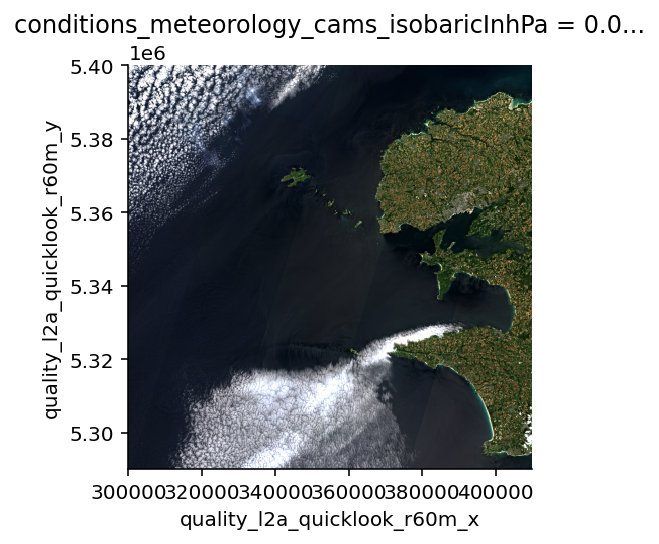

In [10]:
hvplot.extension('matplotlib')
#hvplot.extension('bokeh')

l2a_plot=l2a.quality_l2a_quicklook_r60m_tci.hvplot.rgb(x='quality_l2a_quicklook_r60m_x',
                                              y='quality_l2a_quicklook_r60m_y',
                                              bands='quality_l2a_quicklook_r60m_band',
                                              aspect='equal', 
                                              rasterize=True,
                                              datashader=True
                                             )
l2a_plot

### Compute radiance in advance, before cut of the region.

In [11]:


# 対象バンド
bands = list(l1c['measurements/reflectance/r10m/'].data_vars)

# 出力用のリスト
radiances = []

# 単位変換係数（必要に応じてスケーリング、今は1と仮定）
U = 1.0  

# 入力データ
U: float =l1c.attrs["other_metadata"][
    "reflectance_correction_factor_from_the_Sun-Earth_distance_variation_computed_using_the_acquisition_date"
]
cos_sza_5km = np.cos(np.deg2rad(l1c['conditions']['geometry']['sun_angles'].sel(angle='zenith')))

# バンドごとに放射輝度を計算
for band in bands:
    # Reflectance
    refl = l1c['measurements/reflectance/r10m/'][band]
    
    # solar_illumination を STAC 属性から取得
    solarIrradiance = np.float64(
        l1c.attrs["stac_discovery"]["properties"]["bands"][int(band[1:]) - 1]["solar_illumination"]
    )
    
    # cos(SZA) を10mグリッドに補間
    cos_sza_10m = cos_sza_5km.interp_like(refl)

    # 輝度の計算
    rad = refl * cos_sza_10m * solarIrradiance * U / np.pi
    radiances.append(rad)

# バンド軸を追加して DataArray にまとめる
radiance_da = xr.concat(radiances, dim='band')
radiance_da['band'] = bands
radiance_da.name = 'radiance'

radiance_da

<xarray.DataArray 'radiance' (band: 4, y: 10980, x: 10980)> Size: 4GB
dask.array<concatenate, shape=(4, 10980, 10980), dtype=float64, chunksize=(1, 5490, 5490), chunktype=numpy.ndarray>
Coordinates:
  * x        (x) int64 88kB 300005 300015 300025 300035 ... 409775 409785 409795
  * y        (y) int64 88kB 5399995 5399985 5399975 ... 5290225 5290215 5290205
    angle    <U7 28B 'zenith'
  * band     (band) <U3 48B 'b02' 'b03' 'b04' 'b08'

In [12]:
# B08（10m）を基準にしてデータを取得（例として）
b08 = l1c['measurements']['reflectance']['r10m']['b08']
b8a = l1c['measurements']['reflectance']['r20m']['b8a']

# B8AをB08と同じ解像度に補間（x,y座標を揃える）
b8a_interp = b8a.interp(x=b08.x, y=b08.y, method='linear')
b8a_interp

<xarray.DataArray 'b8a' (y: 10980, x: 10980)> Size: 964MB
dask.array<transpose, shape=(10980, 10980), dtype=float64, chunksize=(10980, 10980), chunktype=numpy.ndarray>
Coordinates:
  * x        (x) int64 88kB 300005 300015 300025 300035 ... 409775 409785 409795
  * y        (y) int64 88kB 5399995 5399985 5399975 ... 5290225 5290215 5290205
Attributes: (12)

### We chose an area

✅ : detector (6)


:Layout
   .DynamicMap.I  :DynamicMap   []
      :Overlay
         .RGB.I        :RGB   [quality_l2a_quicklook_r60m_x,quality_l2a_quicklook_r60m_y]   (R,G,B)
         .Rectangles.I :Rectangles   [x0,y0,x1,y1]
   .DynamicMap.II :DynamicMap   []
      :Image   [x,y]   (TOA reflectance from MSI acquisition at spectral band b04 665.0 nm)
   .NdOverlay.I   :NdOverlay   [Variable]
      :Histogram   [b04]   (Count)
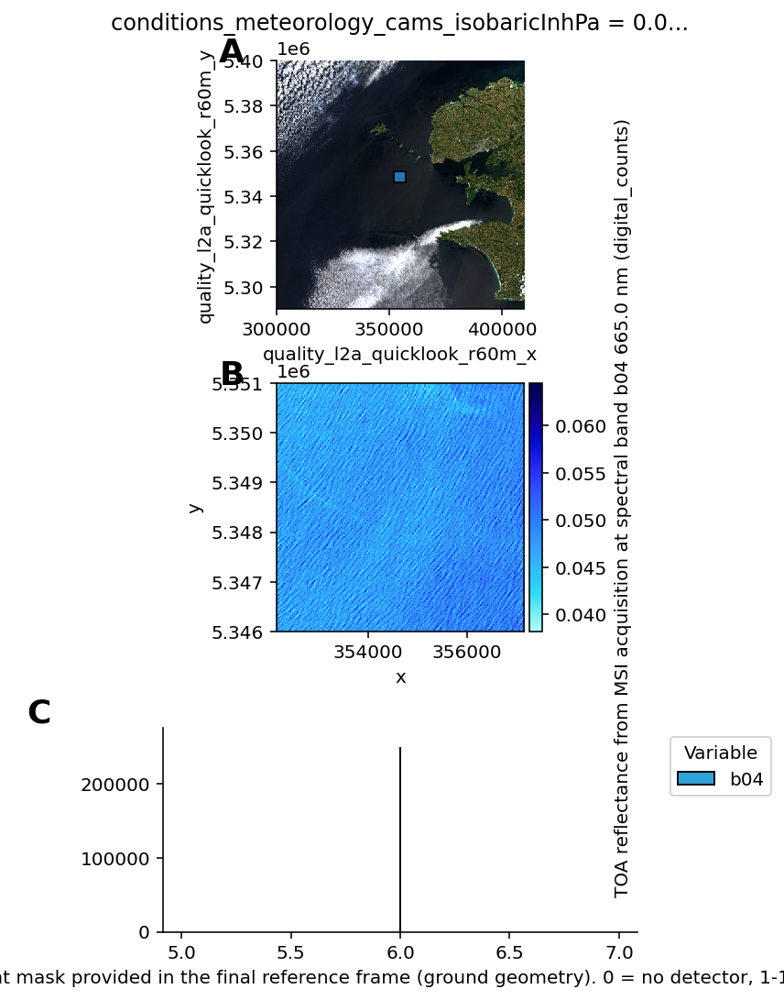

In [13]:
# 基本パラメータ
size=5000
minx= 352150#,351800,363600
miny= 5346000 #5355000, 5343000

#add ocean mask =6 and non cloud mas, and same detector mask so that the chose is helped automatically.
#
size = 5000
minx = 352150
#miny = 5326000
maxx = minx + size
maxy = miny + size


# Box（線だけ）を描く：HoloViewsのRectanglesで (x0, y0, x1, y1)
box = hv.Rectangles([(minx, miny, maxx, maxy)]).opts(
    line_color='white',    # 線の色を白に明示
    line_width=1,
    fill_alpha=0           # 塗りつぶしは透明
)
#clip out l1c in the small area. 
l1c=l1c.sel(x=slice(minx,minx+size),y=slice(miny+size,miny)).persist()
radiance_da=radiance_da.sel(x=slice(minx,minx+size),y=slice(miny+size,miny)).persist()



b04=l1c['measurements']['reflectance']['r10m'].b04
b04_plot=b04.hvplot(x='x', y='y',
                                              aspect='equal', 
                                              rasterize=True,
                                              datashader=True
                                             )
b04_detector = l1c['conditions']['mask']['detector_footprint']['r10m']['b04'].astype(int)

b04_detector_plot = b04_detector.hvplot.hist()

detector = np.unique(b04_detector.values)

if len(detector) > 1:
    raise ValueError(f"b04_detector には複数のユニーク値が含まれています: {detector}")
else:
    print(f"✅ : detector ({detector[0]})")

(l2a_plot * box +b04_plot +b04_detector_plot).cols(1)

:Layout
   .Image.I   :Image   [x,y]   (radiance)
   .Image.II  :Image   [x,y]   (radiance)
   .Image.III :Image   [x,y]   (radiance)
   .Image.IV  :Image   [x,y]   (radiance)
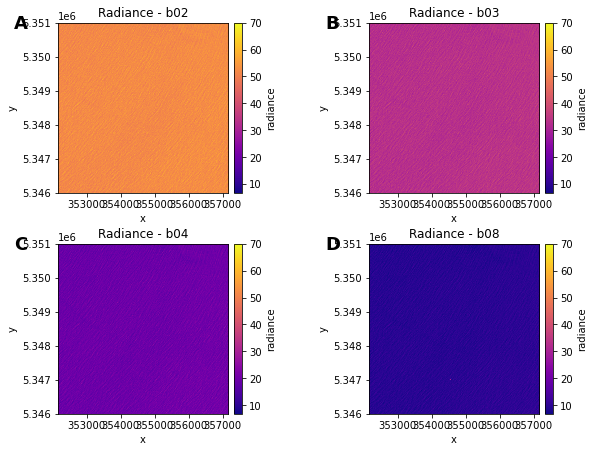

In [14]:


radiance_plot = []

for band in radiance_da.band.values:
    plot = radiance_da.sel(band=band).hvplot(
        x='x',
        y='y',
        #rasterize=True,
        #datashader=True,
        cmap='plasma',
        aspect='equal',
        width=400,
        height=400,
        title=f"Radiance - {band}"
    )
    radiance_plot.append(plot)

# 複数の画像をレイアウトして表示
hv.Layout(radiance_plot).cols(2)

sun angles [[[ 27.0145]]

 [[152.472 ]]]


:Curve   [band]   (onboard_integration_time)
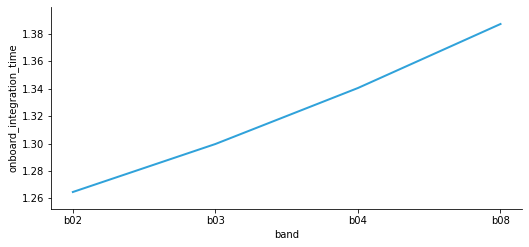

In [15]:
print('sun angles', l1c['conditions']['geometry']['sun_angles'].values)
#
#add here also the graph of onboard_integration_time for each bands
l1c_band_info.sel(band=bands)['onboard_integration_time'].hvplot(x='band')  

In [16]:
hvplot.extension('bokeh')
l1c['conditions']['geometry']['viewing_incidence_angles'].sel(detector=detector).hvplot(x='band')

:DynamicMap   [y,x,detector,angle]
   :Curve   [band]   (viewing_incidence_angles)

In [17]:
#clip out other pre-analysed data here 
#rad_b02=radiance.sel(x=slice(minx,minx+size),y=slice(miny+size,miny)).persist()
b8a_interp=b8a_interp.sel(x=slice(minx,minx+size),y=slice(miny+size,miny)).persist()

In [18]:
l1c['measurements/reflectance/r10m']['b02']

<xarray.DataArray 'b02' (y: 500, x: 500)> Size: 2MB
dask.array<getitem, shape=(500, 500), dtype=float64, chunksize=(500, 275), chunktype=numpy.ndarray>
Coordinates:
  * x        (x) int64 4kB 352155 352165 352175 352185 ... 357125 357135 357145
  * y        (y) int64 4kB 5350995 5350985 5350975 ... 5346025 5346015 5346005
Attributes: (12)

### Image normalisation and filtering

#### Normalisation
We look at the band B04 and B02 -->  bands=['B04','B08','B03','B02']; 

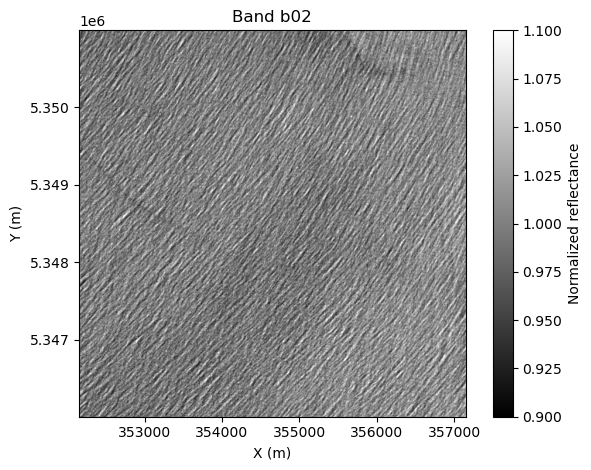

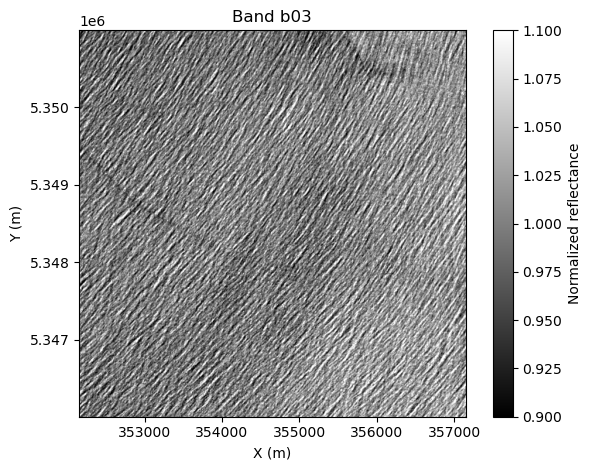

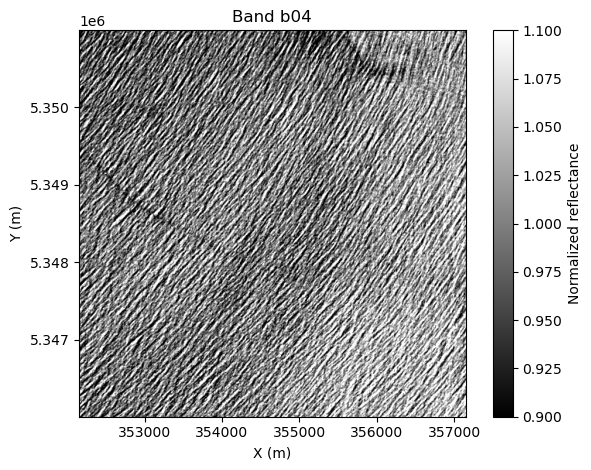

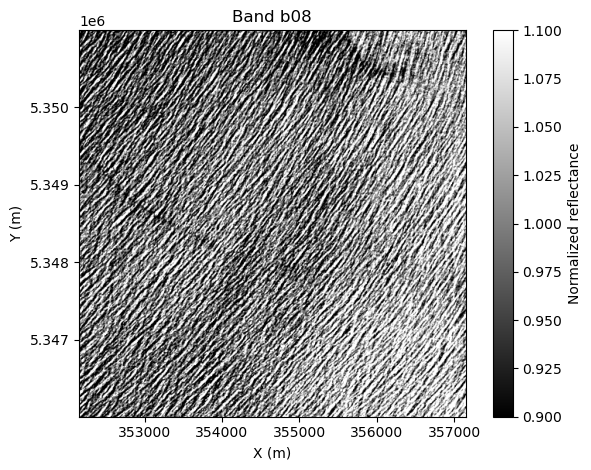

In [19]:
hvplot.extension('matplotlib')
import matplotlib.pyplot as plt
%matplotlib inline

# 描画設定をリセット
plt.close('all')

import numpy as np
import matplotlib.pyplot as plt
import xarray as xr

def normalize_xr_band(band_da):
    """バンドごとに中央値で正規化"""
    median_val = np.nanmedian(band_da.values)
    return band_da / median_val

def plot_normalized_band(band_da,band, vmin=0.9, vmax=1.1):
    """上下反転＆転置で可視化（greyscale）"""
    img = normalize_xr_band(band_da)
    img_vis = np.flipud(np.transpose(img.values))
    
    plt.figure()
    plt.imshow(img.values, 
               vmin=vmin, vmax=vmax, cmap='gray',
               extent=[
                   band_da['x'].values.min(), band_da['x'].values.max(),
                   band_da['y'].values.min(), band_da['y'].values.max()
               ],
               origin='upper')
    plt.xlabel('X (m)')
    plt.ylabel('Y (m)')
    plt.colorbar(label='Normalized reflectance')
    plt.title(f'Band {band}')
    plt.tight_layout()
    plt.show()

for band in bands:
    plot_normalized_band(l1c['measurements/reflectance/r10m'][band], band)

    

#### Filtering white cap (Sobel filter)

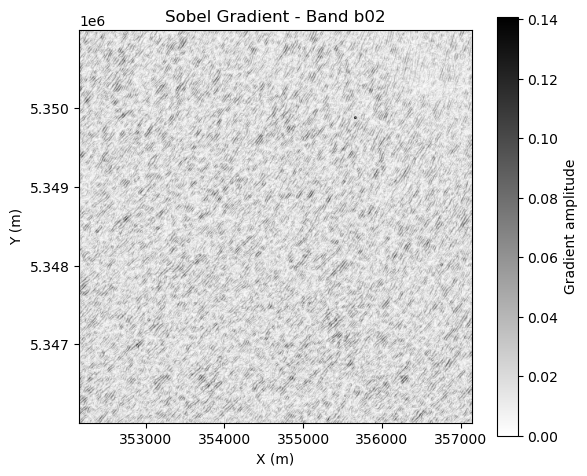

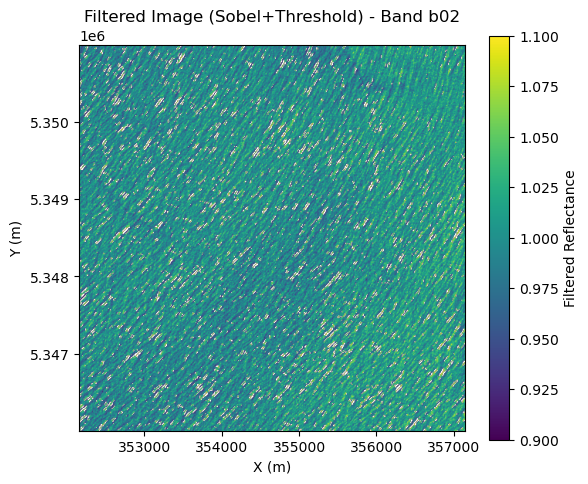

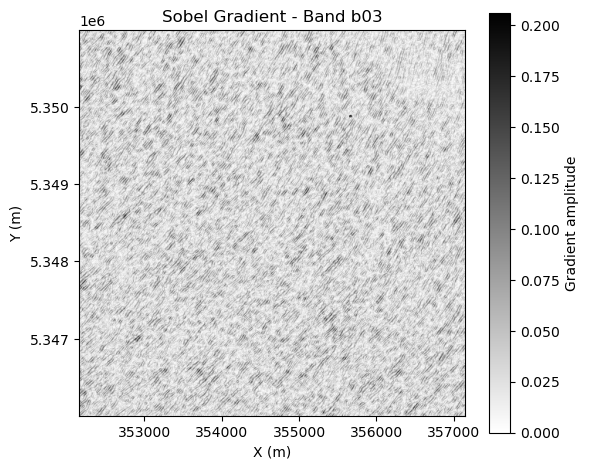

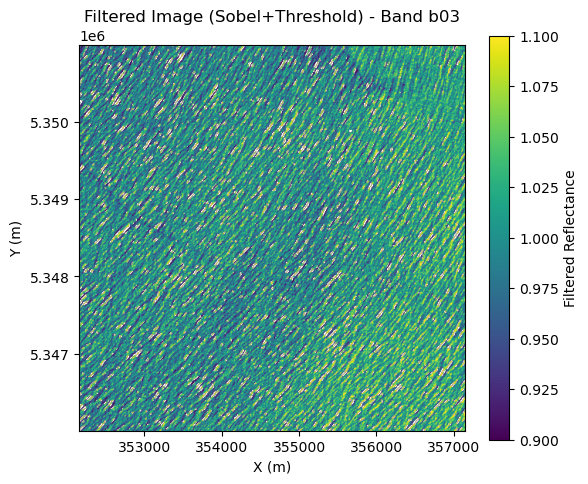

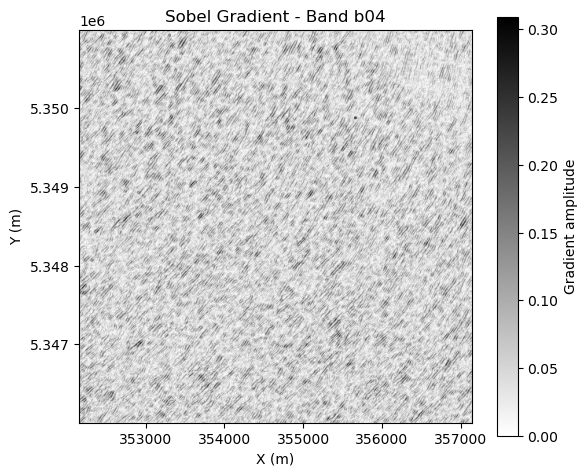

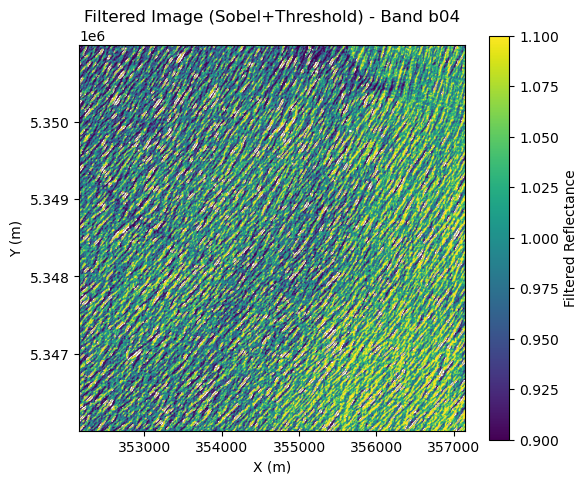

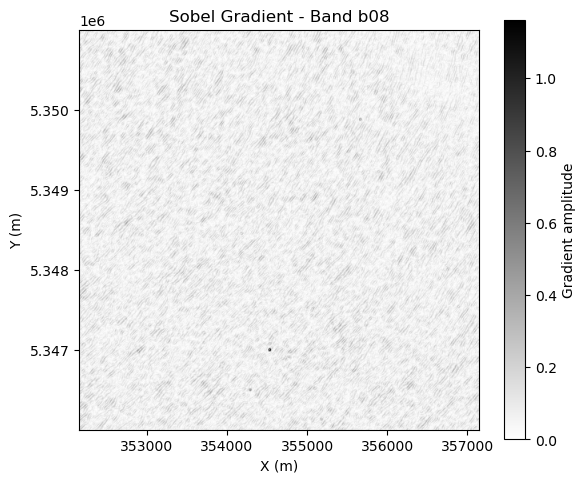

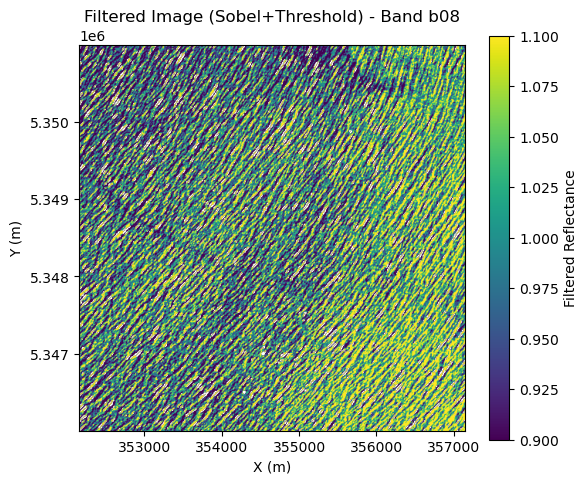

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import sobel

def normalize_xr_band(band_da):
    """バンドごとに中央値で正規化"""
    median_val = np.nanmedian(band_da.values)
    return band_da / median_val

def apply_sobel_and_threshold_xr(band_da, percentile=95):
    """Sobel勾配計算 → しきい値 → フィルタ適用（xarray対応）"""
    norm_img = normalize_xr_band(band_da).compute()
    gradient = xr.apply_ufunc(sobel, norm_img)

    threshold = np.percentile(gradient.values, percentile)
    mask = gradient < threshold

    filtered = norm_img.where(mask)

    return gradient, filtered

def plot_filtered_band(band_da, band, vmin=0.9, vmax=1.1):
    """正規化 → Sobel + しきい値 → 可視化（xarray対応）"""
    gradient, filtered = apply_sobel_and_threshold_xr(band_da)

    extent = [
        band_da['x'].values.min(), band_da['x'].values.max(),
        band_da['y'].values.min(), band_da['y'].values.max()
    ]

    # ① 勾配の可視化
    plt.figure(figsize=(6, 5))
    plt.imshow(gradient.values, cmap="gist_gray_r", extent=extent, origin="upper")
    plt.colorbar(label="Gradient amplitude")
    plt.title(f"Sobel Gradient - Band {band}")
    plt.xlabel("X (m)")
    plt.ylabel("Y (m)")
    plt.tight_layout()
    plt.show()

    # ② フィルタ済画像の可視化
    plt.figure(figsize=(6, 5))
    plt.imshow(filtered.values, cmap="viridis", extent=extent, origin="upper", vmin=vmin, vmax=vmax)
    plt.colorbar(label="Filtered Reflectance")
    plt.title(f"Filtered Image (Sobel+Threshold) - Band {band}")
    plt.xlabel("X (m)")
    plt.ylabel("Y (m)")
    plt.tight_layout()
    plt.show()

    return filtered  # ← xarray.DataArray のまま返す！

# 実行例
filtered_results = {}
for band in bands:
    da = l1c['measurements']['reflectance']['r10m'][band]
    filtered = plot_filtered_band(da, band)
    filtered_results[band] = filtered  # xarray.DataArray を保存

    

In [22]:
l1c['measurements']['reflectance']['r10m']['b02'].ravel()

AttributeError: 'DataArray' object has no attribute 'ravel'

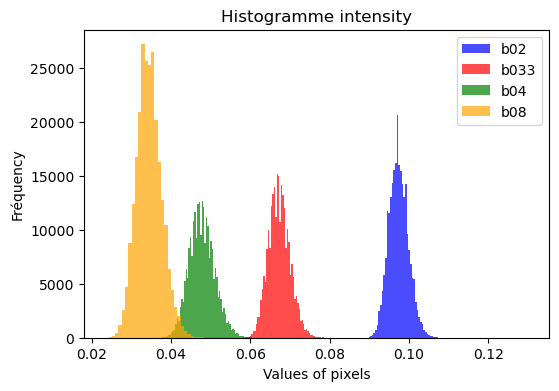

In [23]:
# Display the histogram of values for the original image
plt.figure(figsize=(6, 4))
plt.hist(l1c['measurements']['reflectance']['r10m']['b02'].values.ravel(), bins=100, color='blue', alpha=0.7, label='b02')
plt.hist(l1c['measurements']['reflectance']['r10m']['b03'].values.ravel(), bins=100, color='red', alpha=0.7, label='b033')
plt.hist(l1c['measurements']['reflectance']['r10m']['b04'].values.ravel(), bins=100, color='green', alpha=0.7, label='b04')
plt.hist(l1c['measurements']['reflectance']['r10m']['b08'].values.ravel(), bins=100, color='orange', alpha=0.7, label='b08')

plt.xlabel("Values of pixels")
plt.ylabel("Fréquency")
plt.title("Histogramme intensity")
plt.legend()
plt.show()

### Fourier transform with two images

ntile: numbers of tile used for the welch. In the function FTT2D_two_arrays_nonan replaces the nan values in the images with the local mean. The function used when the image is not filtered is FFT2D _two_arrays

spectrum of the brightness of image\
coherence and phase between two images tzo bands \

this notebook show hz to get wave information from S2 L1C image. 


In [24]:

import numpy as np
import xarray as xr
from scipy.fft import fft2, fftshift


def FFT2D_two_arrays_nonan_da(arraya_da, arrayb_da, dx, dy, n, isplot=False):
    """
    Welch-based 2D FFT spectral analysis for two xarray.DataArray images.
    NaNs are replaced locally with the mean of the tile.
    Returns results as xarray.DataArray objects with (kx, ky) coordinates.
    """
    arraya = arraya_da.values
    arrayb = arrayb_da.values
    nxa, nya = arraya.shape
    mspec = n ** 2 + (n - 1) ** 2
    nxtile = nxa // n
    nytile = nya // n
    dkx = 1 / (dx * nxtile)
    dky = 1 / (dy * nytile)
    shx = nxtile // 2
    shy = nytile // 2

    kx = np.fft.fftshift(np.fft.fftfreq(nxtile, dx))
    ky = np.fft.fftshift(np.fft.fftfreq(nytile, dy))
    kx2, ky2 = np.meshgrid(kx, ky, indexing='ij')

    hanningx = 0.5 * (1 - np.cos(2 * np.pi * np.linspace(0, nxtile - 1, nxtile) / (nxtile - 1)))
    hanningy = 0.5 * (1 - np.cos(2 * np.pi * np.linspace(0, nytile - 1, nytile) / (nytile - 1)))
    hanningxy = np.atleast_2d(hanningy) * np.atleast_2d(hanningx).T

    wc2x = 1 / np.mean(hanningx ** 2)
    wc2y = 1 / np.mean(hanningy ** 2)
    normalization = (wc2x * wc2y) / (dkx * dky)

    Eta = np.zeros((nxtile, nytile))
    Etb = np.zeros((nxtile, nytile))
    phase = np.zeros((nxtile, nytile), dtype=np.complex128)
    phases = np.zeros((nxtile, nytile, mspec), dtype=np.complex128)
    nspec = 0

    for m in range(mspec):
        if m < n ** 2:
            i1 = m // n + 1
            i2 = m + 1 - (i1 - 1) * n
            ix1 = nxtile * (i1 - 1)
            ix2 = nxtile * i1
            iy1 = nytile * (i2 - 1)
            iy2 = nytile * i2
        else:
            i1 = (m - n ** 2) // (n - 1) + 1
            i2 = m + 1 - n ** 2 - (i1 - 1) * (n - 1)
            ix1 = nxtile * (i1 - 1) + shx
            ix2 = nxtile * i1 + shx
            iy1 = nytile * (i2 - 1) + shy
            iy2 = nytile * i2 + shy

        a_tile = arraya[ix1:ix2, iy1:iy2]
        b_tile = arrayb[ix1:ix2, iy1:iy2]

        maska = np.isnan(a_tile)
        maskb = np.isnan(b_tile)
        if np.sum(maska) > 0.5 * a_tile.size or np.sum(maskb) > 0.5 * b_tile.size:
            continue

        a_tile[maska] = np.nanmean(a_tile)
        b_tile[maskb] = np.nanmean(b_tile)

        ta = (a_tile - np.nanmean(a_tile)) * (~maska)
        tb = (b_tile - np.nanmean(b_tile)) * (~maskb)

        fa = fftshift(fft2(ta * hanningxy, norm="forward"))
        fb = fftshift(fft2(tb * hanningxy, norm="forward"))

        Eta += np.abs(fa) ** 2 * normalization
        Etb += np.abs(fb) ** 2 * normalization
        phase += fb * np.conj(fa) * normalization

        phases[:, :, nspec] = (fb * np.conj(fa)) / (np.abs(fb) * np.abs(fa))
        nspec += 1

    Eta /= nspec
    Etb /= nspec
    coh = np.abs((phase / nspec) ** 2) / (Eta * Etb)
    ang = np.angle(phase / nspec)
    crosr = np.real(phase) / mspec
    angstd = np.std(np.angle(phases[:, :, :nspec]), axis=2)

    coords = {"kx": kx, "ky": ky}
    dims = ["kx", "ky"]

    return (
        xr.DataArray(Eta, coords=coords, dims=dims, name="Eta"),
        xr.DataArray(Etb, coords=coords, dims=dims, name="Etb"),
        xr.DataArray(ang, coords=coords, dims=dims, name="phase_angle"),
        xr.DataArray(angstd, coords=coords, dims=dims, name="phase_std"),
        xr.DataArray(coh, coords=coords, dims=dims, name="coherence"),
        xr.DataArray(crosr, coords=coords, dims=dims, name="real_cross_spec"),
        xr.DataArray(phases[:, :, :nspec], coords={"kx": kx, "ky": ky, "tile": np.arange(nspec)}, dims=["kx", "ky", "tile"], name="phases"),
        xr.DataArray(kx2, coords=coords, dims=dims, name="kx2"),
        xr.DataArray(ky2, coords=coords, dims=dims, name="ky2"),
        dkx,
        dky
    )
dx = dy = 10  # Sentinel-2 の 10m ピクセル解像度
ntile = 16

#b02 = l1c['measurements']['reflectance']['r10m'].b02
#b04 = l1c['measurements']['reflectance']['r10m'].b04

# 前処理された画像（例: Sobel + 正規化）を渡すことも可能
band2='b02'
band1='b04'
# 画素の空間分解能 [m]（例：10m 解像度）
dx = dy = 10  
ntile = 16  # Welch法における分割数

# 実行
(Eta, Etb, ang, angstd, coh, crosr, phases, kx2, ky2, dkx, dky) = FFT2D_two_arrays_nonan_da(
    filtered_results[band1], filtered_results[band2], dx, dy, ntile
)
print(np.shape(Eta))
print(np.shape(kx2))
print(np.shape(ky2))

(31, 31)
(31, 31)
(31, 31)


In [25]:
#we already know the detector number when we selected the region, also, we only have one active detector as we didi selected
#our region of interest...
# we can do drop na with detector later to clean up

phitrig_dict=viewing_incidence_angles_azimuth=l1c['conditions/geometry']['viewing_incidence_angles'].sel(angle='azimuth',detector=detector).compute().squeeze()
phitrig_dict

<xarray.DataArray 'viewing_incidence_angles' (band: 13)> Size: 104B
array([50.252 , 89.3232, 76.7395, 67.2367, 62.9197, 59.0881, 55.7501,
       82.7632, 52.7811, 47.8723, 70.2031, 59.88  , 52.337 ])
Coordinates:
    angle     <U7 28B 'azimuth'
  * band      (band) <U3 156B 'b01' 'b02' 'b03' 'b04' ... 'b10' 'b11' 'b12'
    detector  int64 8B 6
    x         int64 8B 355000
    y         int64 8B 5350000
Attributes: (1)

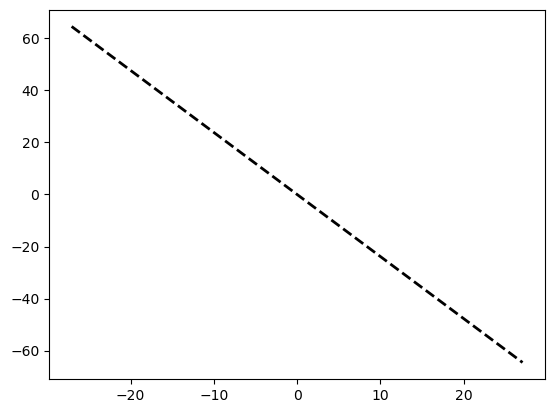

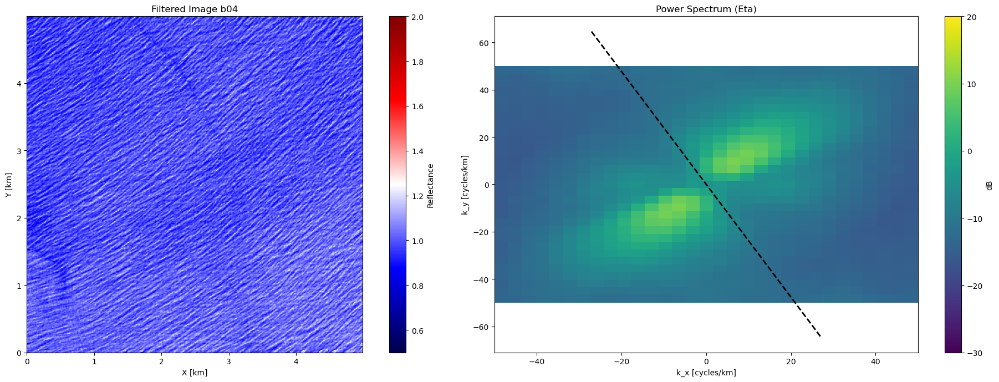

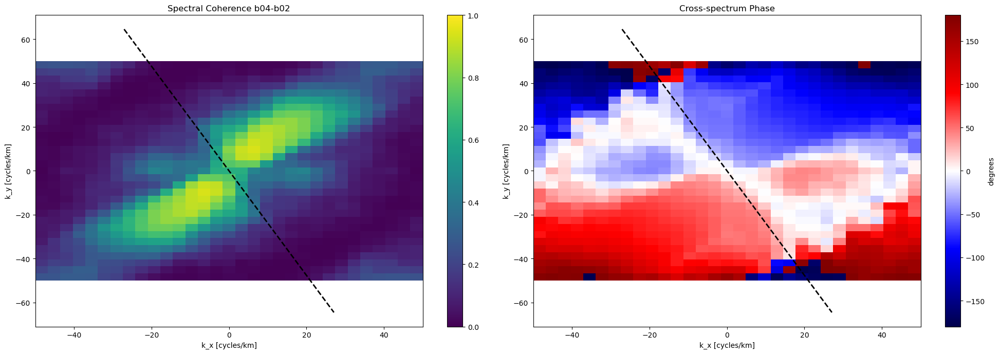

/srv/conda/envs/notebook/lib/python3.12/site-packages/xarray/computation/apply_ufunc.py:818: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)


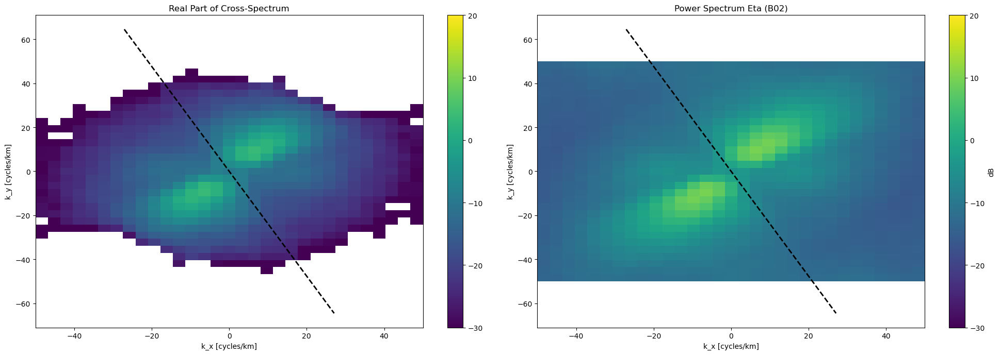

In [26]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np

# Blind方向線（k-space上の非感度方向）


kN = 50  # 最大波数のスケール
#i = 1  # b04 の index（例えば b02:0, b04:1）

phib = phitrig_dict.sel(band=band1) + 90
xkblind = [-1.4 * kN * np.sin(np.radians(phib)), 1.4 * kN * np.sin(np.radians(phib))]
ykblind = [-1.4 * kN * np.cos(np.radians(phib)), 1.4 * kN * np.cos(np.radians(phib))]

plt.plot(xkblind, ykblind, 'k--', lw=2)



# 空間座標 X, Y 作成（filtered_b04 から）
X = filtered_results[band1]['x'].values
Y = filtered_results[band1]['y'].values
X_km = (X - X.min()) / 1000
Y_km = (Y - Y.min()) / 1000

# 表示範囲
extent = [X_km.min(), X_km.max(), Y_km.min(), Y_km.max()]

# 1. 元画像とスペクトルの比較
fig, axs = plt.subplots(1, 2, figsize=(20, 7))
axs[0].imshow(filtered_results[band1].T, cmap='seismic', origin='upper',
              extent=extent, norm=mcolors.Normalize(vmin=0.5, vmax=2))
axs[0].set_title("Filtered Image "+band1)
axs[0].set_xlabel("X [km]")
axs[0].set_ylabel("Y [km]")
plt.colorbar(axs[0].images[0], ax=axs[0], label="Reflectance")

axs[1].pcolormesh(kx2 * 1000, ky2 * 1000, 10 * np.log10(Eta),
                  norm=mcolors.Normalize(vmin=-30, vmax=20))
axs[1].plot(xkblind, ykblind, 'k--', linewidth=2)
axs[1].set_title("Power Spectrum (Eta)")
axs[1].set_xlabel("k_x [cycles/km]")
axs[1].set_ylabel("k_y [cycles/km]")
plt.colorbar(axs[1].collections[0], ax=axs[1], label="dB")
plt.tight_layout()
plt.show()

# 2. コヒーレンスと位相角
fig, axs = plt.subplots(1, 2, figsize=(20, 7))

axs[0].pcolormesh(kx2 * 1000, ky2 * 1000, coh, norm=mcolors.Normalize(vmin=0, vmax=1))
axs[0].plot(xkblind, ykblind, 'k--', linewidth=2)
axs[0].set_title("Spectral Coherence "+band1+"-"+band2)
axs[0].set_xlabel("k_x [cycles/km]")
axs[0].set_ylabel("k_y [cycles/km]")
plt.colorbar(axs[0].collections[0], ax=axs[0])

axs[1].pcolormesh(kx2 * 1000, ky2 * 1000, np.degrees(ang),
                  cmap='seismic', norm=mcolors.Normalize(vmin=-180, vmax=180))
axs[1].plot(xkblind, ykblind, 'k--', linewidth=2)
axs[1].set_title("Cross-spectrum Phase")
axs[1].set_xlabel("k_x [cycles/km]")
axs[1].set_ylabel("k_y [cycles/km]")
plt.colorbar(axs[1].collections[0], ax=axs[1], label="degrees")
plt.tight_layout()
plt.show()

# 3. Crossスペクトルの実部と PSD
fig, axs = plt.subplots(1, 2, figsize=(20, 7))

axs[0].pcolormesh(kx2 * 1000, ky2 * 1000, 10 * np.log10(crosr),
                  norm=mcolors.Normalize(vmin=-30, vmax=20))
axs[0].plot(xkblind, ykblind, 'k--', linewidth=2)
axs[0].set_title("Real Part of Cross-Spectrum")
axs[0].set_xlabel("k_x [cycles/km]")
axs[0].set_ylabel("k_y [cycles/km]")
plt.colorbar(axs[0].collections[0], ax=axs[0])

axs[1].pcolormesh(kx2 * 1000, ky2 * 1000, 10 * np.log10(Eta),
                  norm=mcolors.Normalize(vmin=-30, vmax=20))
axs[1].plot(xkblind, ykblind, 'k--', linewidth=2)
axs[1].set_title("Power Spectrum Eta (B02)")
axs[1].set_xlabel("k_x [cycles/km]")
axs[1].set_ylabel("k_y [cycles/km]")
plt.colorbar(axs[1].collections[0], ax=axs[1], label="dB")
plt.tight_layout()
plt.show()

# 4. Coherence (rad/m) 表示など、単位変更も必要なら追加で:
# axs[0].pcolormesh(kx2*2*np.pi, ky2*2*np.pi, coh, ...) など

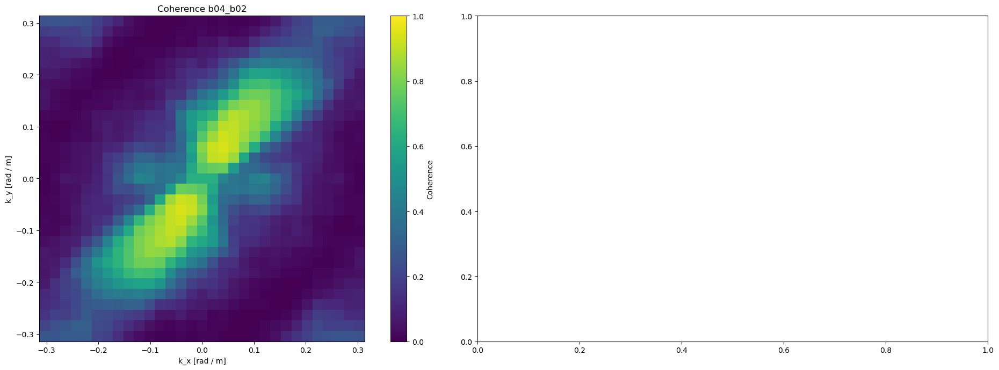

In [27]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# ラジアン単位に変換（kx2, ky2 は cycles/m → rad/m）
kx_rad = 2 * np.pi * kx2
ky_rad = 2 * np.pi * ky2

# Figure 作成
fig, axs = plt.subplots(1, 2, figsize=(20, 7))
axs[0].set_aspect('equal', adjustable='box')

# 左図：Coherence
im = axs[0].pcolormesh(
    kx_rad, ky_rad, coh,
    norm=mcolors.Normalize(vmin=0, vmax=1),
    cmap='viridis'
)
plt.colorbar(im, ax=axs[0], label='Coherence')
axs[0].set_xlabel('k_x [rad / m]')
axs[0].set_ylabel('k_y [rad / m]')
axs[0].set_title('Coherence '+band1+"_"+band2)

# 右図に他の情報（例: Phase など）を入れる場合はここに続けて記述できます

plt.tight_layout()
plt.show()

### Start computing the wave properties

In [28]:
hvplot.extension('matplotlib')
import matplotlib.pyplot as plt
%matplotlib inline

# 描画設定をリセット
plt.close('all')

import matplotlib.pyplot as plt




In [29]:
from scipy.ndimage import gaussian_filter

# 2. 平滑化（ガウシアンフィルター）
#B = b04.values
band='b04'
B = radiance_da.sel(band=band).values

sigma = 20  # 平滑化スケール
B_smooth = gaussian_filter(B, sigma=sigma)

# 3. 差分を計算
delta_B = B - B_smooth


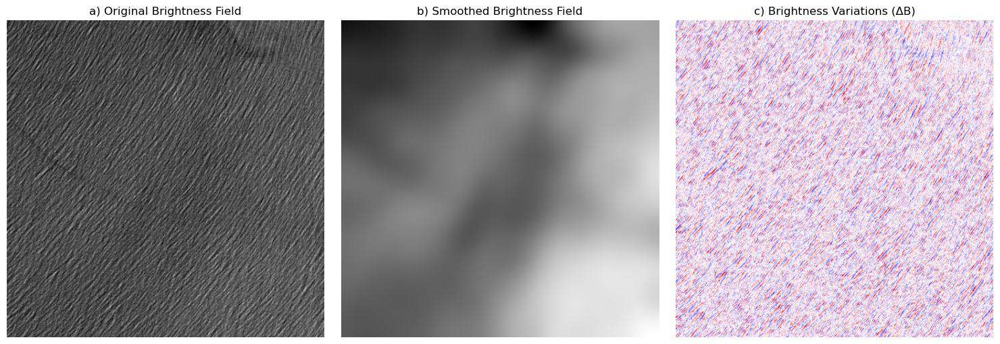

In [30]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(B, cmap='gray')
axs[0].set_title('a) Original Brightness Field')
axs[0].axis('off')

axs[1].imshow(B_smooth, cmap='gray')
axs[1].set_title('b) Smoothed Brightness Field')
axs[1].axis('off')

axs[2].imshow(delta_B, cmap='seismic', vmin=-np.max(np.abs(delta_B)), vmax=np.max(np.abs(delta_B)))
axs[2].set_title('c) Brightness Variations (ΔB)')
axs[2].axis('off')

plt.tight_layout()
plt.show()

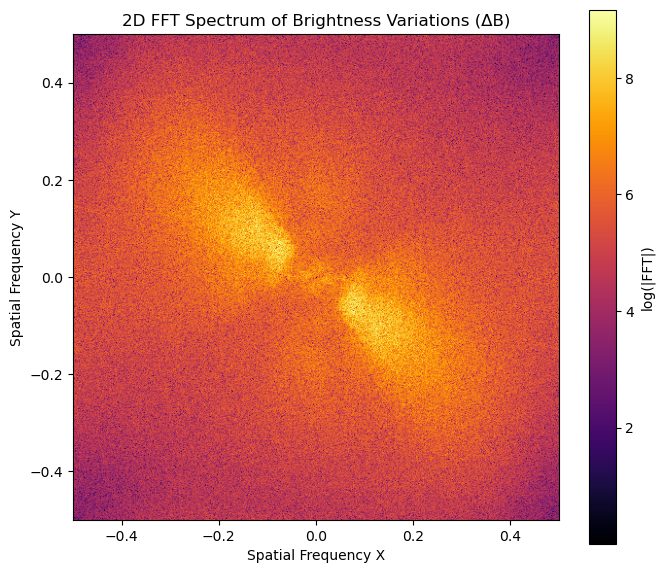

In [31]:
import numpy.fft as fft
import matplotlib.pyplot as plt

# 2次元FFTの実行
F = fft.fft2(delta_B)
F_shifted = fft.fftshift(F)  # ゼロ周波数を中心にシフト
magnitude_spectrum = np.abs(F_shifted)

# 対数スケールで視覚化（ダイナミックレンジを扱いやすくするため）
log_magnitude = np.log1p(magnitude_spectrum)

# プロット
plt.figure(figsize=(7, 6))
plt.imshow(log_magnitude, cmap='inferno', extent=[-0.5, 0.5, -0.5, 0.5])
plt.title('2D FFT Spectrum of Brightness Variations (ΔB)')
plt.xlabel('Spatial Frequency X')
plt.ylabel('Spatial Frequency Y')
plt.colorbar(label='log(|FFT|)')
plt.tight_layout()
plt.show()

/tmp/ipykernel_6856/4248785733.py:15: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  plt.pcolormesh(theta, r, np.log1p(polar_spectrum), shading='auto', cmap='inferno')


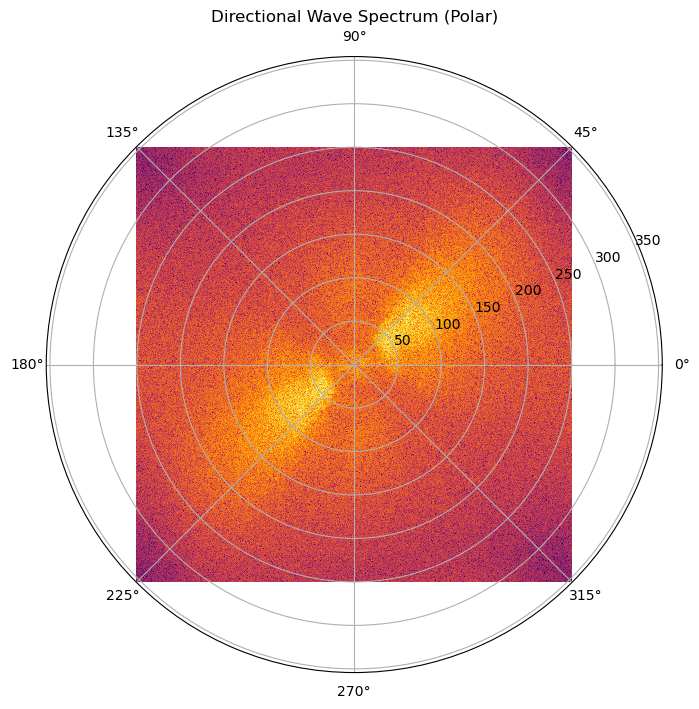

In [33]:
import numpy as np

def cartesian_to_polar(data):
    ny, nx = data.shape
    x, y = np.meshgrid(np.linspace(-nx//2, nx//2, nx), np.linspace(-ny//2, ny//2, ny))
    r = np.sqrt(x**2 + y**2)
    theta = np.arctan2(y, x)
    return r, theta, data

r, theta, polar_spectrum = cartesian_to_polar(magnitude_spectrum)

# 極座標表示
plt.figure(figsize=(8, 8))
plt.subplot(projection='polar')
plt.pcolormesh(theta, r, np.log1p(polar_spectrum), shading='auto', cmap='inferno')
plt.title('Directional Wave Spectrum (Polar)')
plt.show()

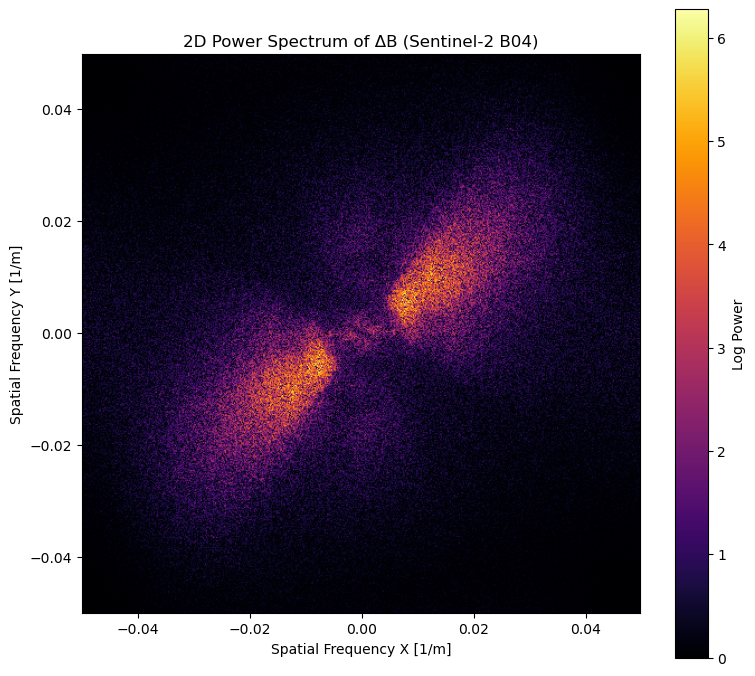

In [34]:
import numpy as np
from scipy.ndimage import gaussian_filter
from numpy.fft import fft2, fftshift, fftfreq
import matplotlib.pyplot as plt

# Sentinel-2 B04の反射率取得（10m分解能）
b04 = l1c['measurements']['reflectance']['r10m']['b04']

# 平滑化して ΔB（変動成分）を抽出
sigma = 20
delta_b04 = b04.values - gaussian_filter(b04.values, sigma=sigma)

# 2次元FFTとシフト
F_b04 = fft2(delta_b04)
F_b04_shifted = fftshift(F_b04)

# パワースペクトル（エネルギー）計算
spectrum_b04 = np.abs(F_b04_shifted) ** 2

# ======= 📏 空間周波数軸の定義 (1/m 単位) =======
ny, nx = delta_b04.shape
pixel_spacing = 10  # B04は10m解像度

fx = fftshift(fftfreq(nx, d=pixel_spacing))  # X方向の空間周波数 [1/m]
fy = fftshift(fftfreq(ny, d=pixel_spacing))  # Y方向の空間周波数 [1/m]

extent = [fx.min(), fx.max(), fy.min(), fy.max()]

# ======= 🖼️ プロット（物理スケールに更新） =======
plt.figure(figsize=(8, 7))
plt.imshow(np.log1p(spectrum_b04), cmap='inferno', extent=extent, origin='lower')
plt.colorbar(label='Log Power')
plt.title('2D Power Spectrum of ΔB (Sentinel-2 B04)')
plt.xlabel('Spatial Frequency X [1/m]')
plt.ylabel('Spatial Frequency Y [1/m]')
plt.tight_layout()
plt.show()

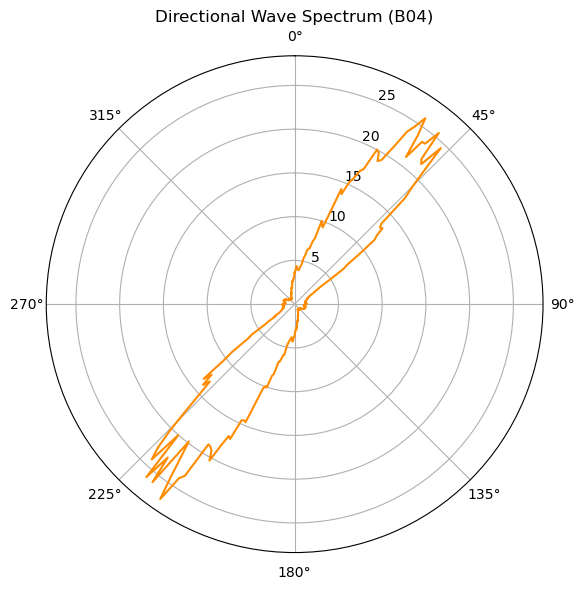

In [35]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import map_coordinates

# delta_b04 から取得した 2D FFT
F_b04 = fft2(delta_b04)
F_b04_shifted = fftshift(F_b04)
power_spectrum = np.abs(F_b04_shifted)**2

# サイズと中心
ny, nx = power_spectrum.shape
cy, cx = ny // 2, nx // 2

# r, theta グリッド（極座標空間）
n_r = min(cx, cy)
n_theta = 360  # 分解能（角度方向）

r_vals = np.linspace(0, n_r, n_r)
theta_vals = np.linspace(0, 2 * np.pi, n_theta)

# 各 r, θ に対して x, y 座標を計算
rr, tt = np.meshgrid(r_vals, theta_vals)
x = cx + rr * np.cos(tt)
y = cy + rr * np.sin(tt)

# スペクトルを (r, θ) 空間に再サンプリング
coords = np.array([y.ravel(), x.ravel()])
polar_spectrum = map_coordinates(power_spectrum, coords, order=1).reshape((n_theta, n_r))

# 方向ごとに平均（もしくは積分）
directional_spectrum = polar_spectrum.mean(axis=1)

# 可視化（極座標プロット）
plt.figure(figsize=(6,6))
ax = plt.subplot(111, polar=True)
ax.plot(theta_vals, directional_spectrum, color='darkorange')
ax.set_theta_zero_location('N')
ax.set_theta_direction(-1)
ax.set_title('Directional Wave Spectrum (B04)')
plt.tight_layout()
plt.show()

In [36]:
#📌 5. クロススペクトル相関 (B08 vs B8A)
b08 = l1c['measurements']['reflectance']['r10m']['b08']


# numpy配列に変換してからFFTの前処理
# 背景除去

delta_b08 = b08.values - gaussian_filter(b08.values, sigma=sigma)
delta_b8a = b8a_interp.values - gaussian_filter(b8a_interp.values, sigma=sigma)

# FFT (2Dスペクトル)
F_b08 = fft2(delta_b08)
F_b8a = fft2(delta_b8a)

# クロススペクトル相関の計算
cross_spectrum = F_b08 * np.conj(F_b8a)
cross_corr = fftshift(np.abs(cross_spectrum))

# 位相差
phase_diff = fftshift(np.angle(cross_spectrum))

# 波数の計算
pixel_size = 10  # 10m
ny, nx = delta_b08.shape
kx = np.fft.fftshift(np.fft.fftfreq(nx, pixel_size)) * 2 * np.pi
ky = np.fft.fftshift(np.fft.fftfreq(ny, pixel_size)) * 2 * np.pi
kx_grid, ky_grid = np.meshgrid(kx, ky)
k_magnitude = np.sqrt(kx_grid**2 + ky_grid**2)



In [37]:
time_b08=l1c_band_info.sel(band='b08')['onboard_integration_time']
time_b8a=l1c_band_info.sel(band='b8a')['onboard_integration_time']

time_diff_b08_b8a = abs(time_b08 - time_b8a)   # 秒
print(f"バンド間の露光時間差（B08-B8A）: {time_diff_b08_b8a:.4f} 秒")

# 位相速度 (m/s)
phase_velocity = phase_diff / (k_magnitude * time_diff_b08_b8a.values)
#phase_velocity[np.abs(phase_velocity) > 10] = np.nan  # 異常値除去

バンド間の露光時間差（B08-B8A）: 1.3735 秒


/tmp/ipykernel_6856/2969004729.py:8: RuntimeWarning: invalid value encountered in divide
  phase_velocity = phase_diff / (k_magnitude * time_diff_b08_b8a.values)


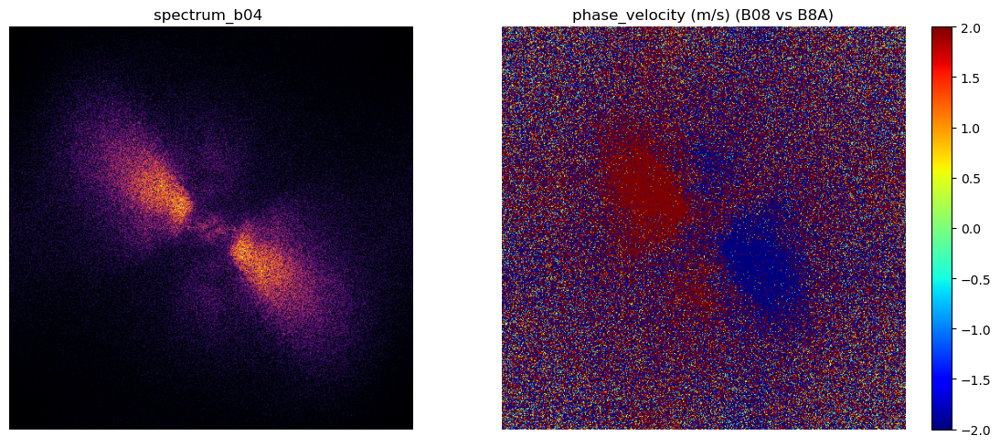

In [38]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# 波のパワースペクトル
ax[0].imshow(np.log1p(spectrum_b04), cmap='inferno')
ax[0].set_title('spectrum_b04 ')
ax[0].axis('off')

# 位相速度分布
im = ax[1].imshow(phase_velocity, cmap='jet', vmin=-2, vmax=2)
ax[1].set_title('phase_velocity (m/s) (B08 vs B8A)')
ax[1].axis('off')
fig.colorbar(im, ax=ax[1])

plt.tight_layout()
plt.show()

In [39]:
#📌 Step 2: 波数・周波数軸の物理単位への変換（波長と速度の算出）

# 空間解像度 (Sentinel-2)
pixel_size = 10  # メートル（10m解像度の場合）
ny, nx = delta_b08.shape

# 波数軸の計算
kx = np.fft.fftshift(np.fft.fftfreq(nx, pixel_size)) * 2 * np.pi  # rad/m
ky = np.fft.fftshift(np.fft.fftfreq(ny, pixel_size)) * 2 * np.pi  # rad/m
kx_grid, ky_grid = np.meshgrid(kx, ky)
k_magnitude = np.sqrt(kx_grid**2 + ky_grid**2)

# 波長 (m)
wavelength = 2 * np.pi / k_magnitude

wavelength

/tmp/ipykernel_6856/410145997.py:14: RuntimeWarning: divide by zero encountered in divide
  wavelength = 2 * np.pi / k_magnitude


array([[14.14213562, 14.17044812, 14.19881684, ..., 14.22724144,
        14.19881684, 14.17044812],
       [14.17044812, 14.19893135, 14.22747183, ..., 14.25606921,
        14.22747183, 14.19893135],
       [14.19881684, 14.22747183, 14.2561851 , ..., 14.28495633,
        14.2561851 , 14.22747183],
       ...,
       [14.22724144, 14.25606921, 14.28495633, ..., 14.31390245,
        14.28495633, 14.25606921],
       [14.19881684, 14.22747183, 14.2561851 , ..., 14.28495633,
        14.2561851 , 14.22747183],
       [14.17044812, 14.19893135, 14.22747183, ..., 14.25606921,
        14.22747183, 14.19893135]], shape=(500, 500))

In [40]:
sun_zenith = l1c['conditions']['geometry']['sun_angles'].sel(angle='zenith')
view_zenith = l1c['conditions']['geometry']['viewing_incidence_angles'].sel(angle='zenith',detector=detector)


theta_sun_rad = np.radians(sun_zenith)
theta_view_rad = np.radians(view_zenith)

#B0 = np.mean(b04)  # 背景輝度の代表値
#MTF = B0 * np.tan(theta_sun_rad) / (2 * sigma**2)  # 伝達関数の簡易近似

B0 = np.mean(b04)  # 背景輝度の代表値
sigma = 20  # 平滑化半径

MTF = B0 * (np.tan(theta_sun_rad) + np.tan(theta_view_rad.sel(band='b04'))) / (2 * sigma**2)
MTF=MTF.compute().values

MTF


array([[[3.19038023e-05]]])

In [50]:
#位相速度 C は、2バンド間の位相差と時間差（2秒）から求まります：
time_lag =time_diff_b08_b8a.values
# 位相差 → 位相速度へ変換 (速度 = 位相差/時間差/波数)
phase_velocity = phase_diff / (k_magnitude * time_lag)

# 物理的に妥当な範囲でのクリッピング（異常値除去）
phase_velocity[np.abs(phase_velocity) > 10] = np.nan


#📌 Step 3: 伝達関数 (MTF: Modulation Transfer Function) の正確な計算
# 衛星の視角と太陽の位置 (論文参照)
sun_zenith = l1c['conditions']['geometry']['sun_angles'].sel(angle='zenith')
view_zenith = l1c['conditions']['geometry']['viewing_incidence_angles'].sel(angle='zenith')

theta_sun = np.radians(30)  # 太陽天頂角 (rad)
theta_view = np.radians(10)  # 観測天頂角 (rad)

# MTF の近似計算（輝度勾配に依存）
B0 = np.mean(b08)  # 背景輝度の代表値
MTF = B0 * np.tan(theta_sun) / (2 * sigma**2)  # 簡易近似

#📌 Step 4: 波の高さスペクトルへ変換
wave_elevation_spectrum = spectrum_b04/(MTF**2).compute().values


/tmp/ipykernel_6856/3485927704.py:4: RuntimeWarning: invalid value encountered in divide
  phase_velocity = phase_diff / (k_magnitude * time_lag)


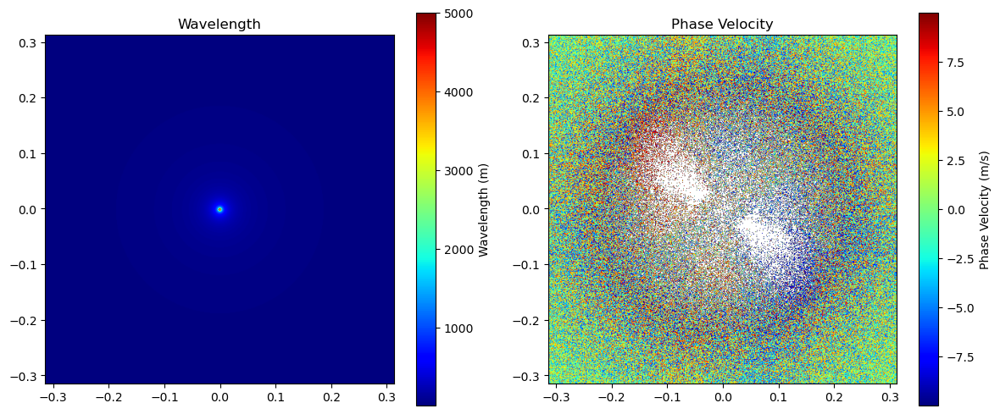

In [51]:
#plot
plt.figure(figsize=(12, 5))

# 波長
plt.subplot(1, 2, 1)
plt.imshow(wavelength, extent=[kx.min(), kx.max(), ky.min(), ky.max()], cmap='jet')
plt.colorbar(label='Wavelength (m)')
plt.title('Wavelength')

# 位相速度
plt.subplot(1, 2, 2)
plt.imshow(phase_velocity, extent=[kx.min(), kx.max(), ky.min(), ky.max()], cmap='jet')
plt.colorbar(label='Phase Velocity (m/s)')
plt.title('Phase Velocity')

plt.tight_layout()
plt.show()